In [51]:
library(DataComputing)
library(mapproj)
library(ggmap)
library(repr)

options(repr.plot.width=10, repr.plot.height=8)

## Data Preprocessing
We preprocess the data by filtering out some data not in San Francisco

In [9]:
data = read.csv("../data/train.csv")

data = data %>%
    mutate(Category=as.factor(Category), DayOfWeek=as.factor(DayOfWeek),
           Resolution=as.factor(Resolution), Descript=as.factor(Descript)) %>%
    filter(X < -122.25, X > -122.52, Y < 37.81, Y > 37.7)


head(data)
summary(data)

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
1,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.4259,37.7746
2,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.4259,37.7746
3,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.4244,37.80041
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.427,37.80087
5,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.4387,37.77154
6,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM UNLOCKED AUTO,Wednesday,INGLESIDE,NONE,0 Block of TEDDY AV,-122.4033,37.71343


                 Dates                  Category     
 2011-01-01 00:01:00:   185   LARCENY/THEFT :174836  
 2006-01-01 00:01:00:   136   OTHER OFFENSES:126109  
 2012-01-01 00:01:00:    94   NON-CRIMINAL  : 92260  
 2006-01-01 12:00:00:    63   ASSAULT       : 76812  
 2007-06-01 00:01:00:    61   DRUG/NARCOTIC : 53966  
 2006-06-01 00:01:00:    58   VEHICLE THEFT : 53720  
 (Other)            :876960   (Other)       :299854  
                                  Descript          DayOfWeek     
 GRAND THEFT FROM LOCKED AUTO         : 59997   Friday   :133643  
 LOST PROPERTY                        : 31720   Monday   :121504  
 BATTERY                              : 27420   Saturday :126759  
 STOLEN AUTOMOBILE                    : 26874   Sunday   :116633  
 DRIVERS LICENSE, SUSPENDED OR REVOKED: 26821   Thursday :124971  
 WARRANT ARREST                       : 23744   Tuesday  :124909  
 (Other)                              :680981   Wednesday:129138  
      PdDistrict                

We print out the different type of crimes and resolution

In [10]:
levels(data$Category)
levels(data$Resolution)

[1] "ARSON"                       "ASSAULT"                    
 [3] "BAD CHECKS"                  "BRIBERY"                    
 [5] "BURGLARY"                    "DISORDERLY CONDUCT"         
 [7] "DRIVING UNDER THE INFLUENCE" "DRUG/NARCOTIC"              
 [9] "DRUNKENNESS"                 "EMBEZZLEMENT"               
[11] "EXTORTION"                   "FAMILY OFFENSES"            
[13] "FORGERY/COUNTERFEITING"      "FRAUD"                      
[15] "GAMBLING"                    "KIDNAPPING"                 
[17] "LARCENY/THEFT"               "LIQUOR LAWS"                
[19] "LOITERING"                   "MISSING PERSON"             
[21] "NON-CRIMINAL"                "OTHER OFFENSES"             
[23] "PORNOGRAPHY/OBSCENE MAT"     "PROSTITUTION"               
[25] "RECOVERED VEHICLE"           "ROBBERY"                    
[27] "RUNAWAY"                     "SECONDARY CODES"            
[29] "SEX OFFENSES FORCIBLE"       "SEX OFFENSES NON FORCIBLE"  
[31] "STOLEN PROPERTY"             "SUICIDE"                    
[33] "SUSPICIOUS OCC"              "TREA"                       
[35] "TRESPASS"                    "VANDALISM"                  
[37] "VEHICLE THEFT"               "WARRANTS"                   
[39] "WEAPON LAWS"

[1] "ARREST, BOOKED"                        
 [2] "ARREST, CITED"                         
 [3] "CLEARED-CONTACT JUVENILE FOR MORE INFO"
 [4] "COMPLAINANT REFUSES TO PROSECUTE"      
 [5] "DISTRICT ATTORNEY REFUSES TO PROSECUTE"
 [6] "EXCEPTIONAL CLEARANCE"                 
 [7] "JUVENILE ADMONISHED"                   
 [8] "JUVENILE BOOKED"                       
 [9] "JUVENILE CITED"                        
[10] "JUVENILE DIVERTED"                     
[11] "LOCATED"                               
[12] "NONE"                                  
[13] "NOT PROSECUTED"                        
[14] "PROSECUTED BY OUTSIDE AGENCY"          
[15] "PROSECUTED FOR LESSER OFFENSE"         
[16] "PSYCHOPATHIC CASE"                     
[17] "UNFOUNDED"

## Crime type distirbution

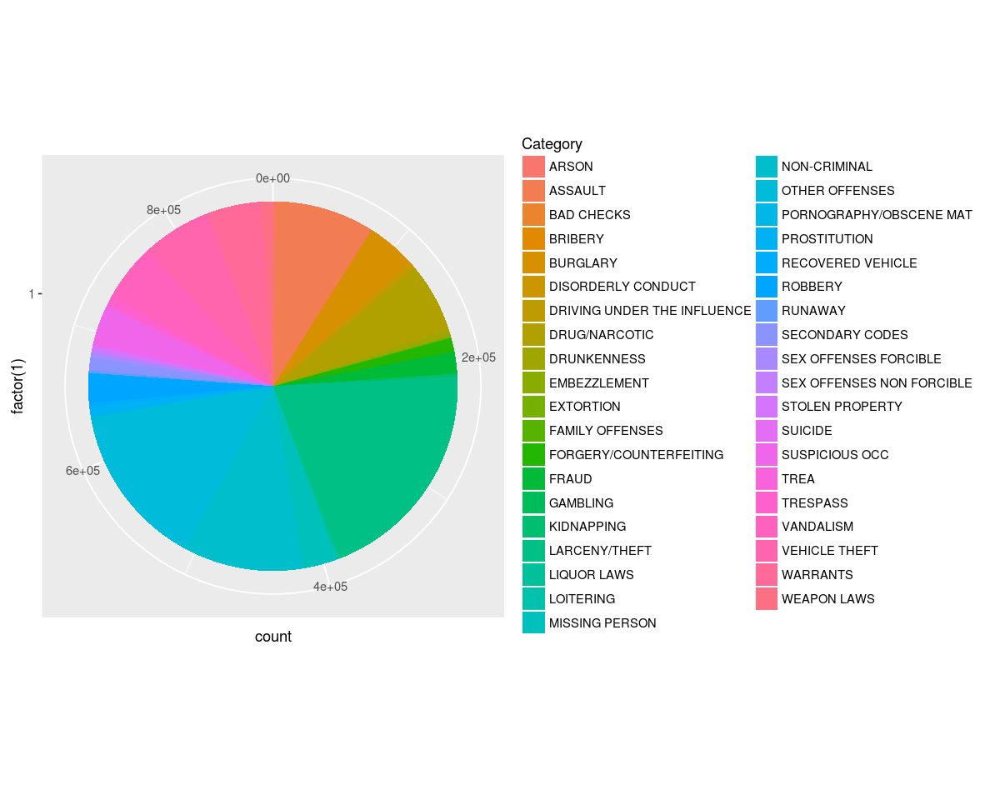

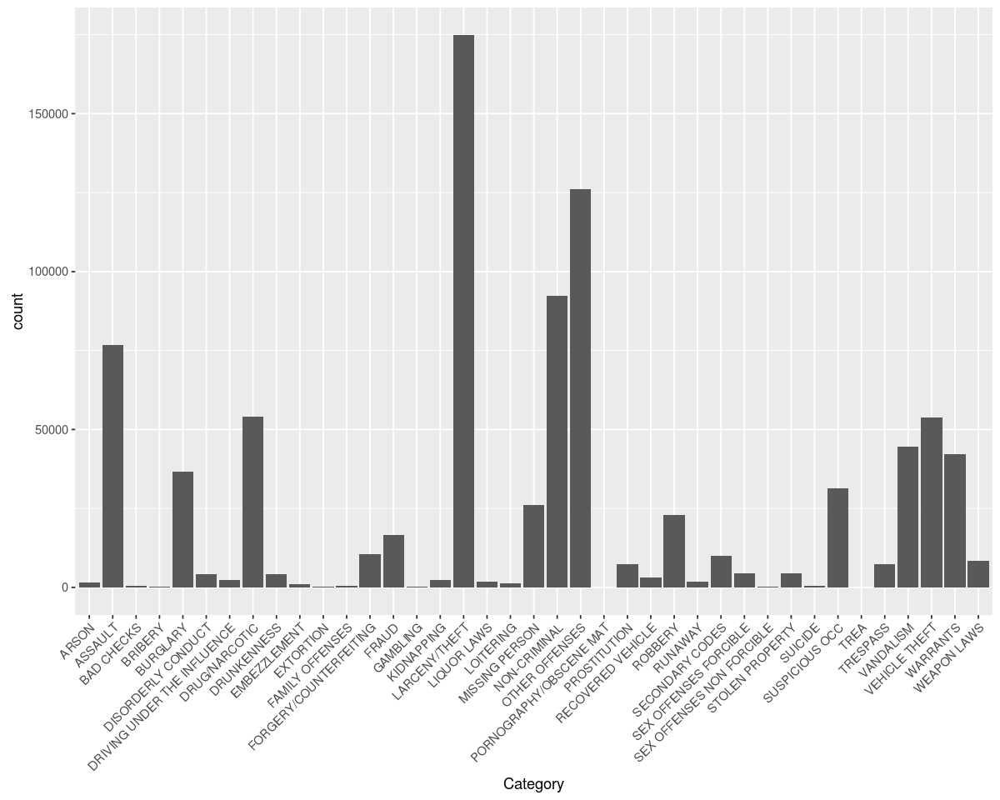

In [108]:
ggplot(data, aes(x=factor(1), fill=Category)) +
    geom_bar(width = 1) +
    coord_polar(theta = "y") +
    theme(legend.position='right', legend.direction='vertical')

ggplot(data, aes(x=Category)) +
    geom_bar() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

## Crime Resolution Distribution

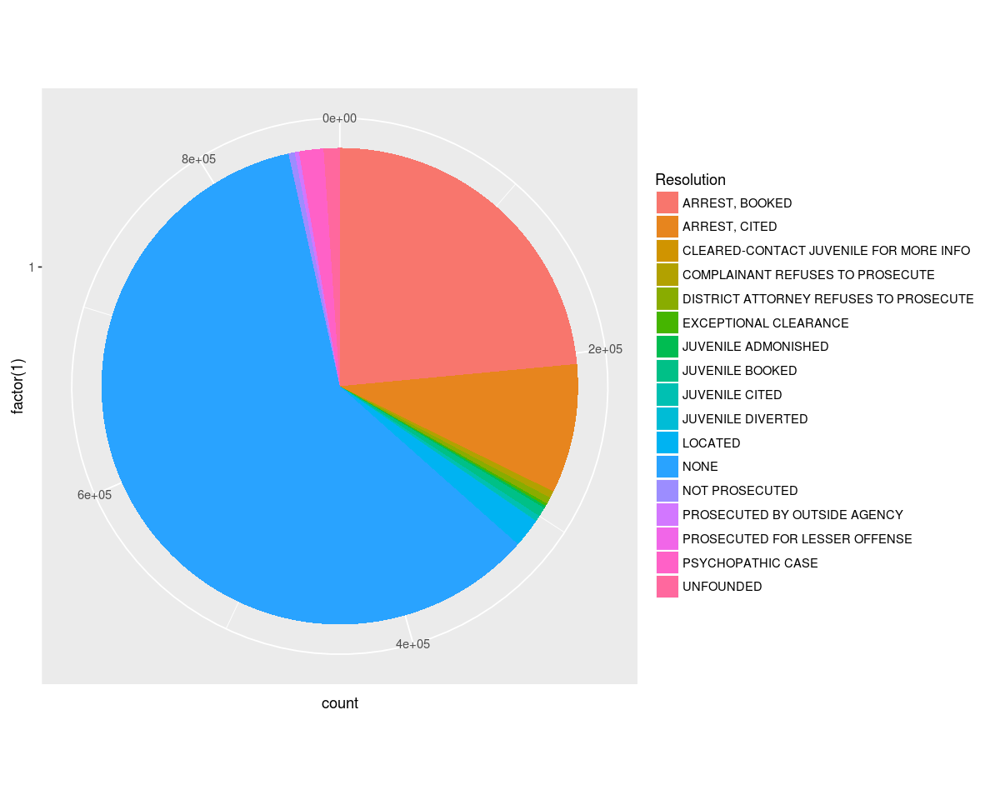

In [53]:
ggplot(data, aes(x=factor(1), fill=Resolution)) +
    geom_bar(width = 1) +
    coord_polar(theta = "y") +
    theme(legend.position='right')

## Crime Spatial Distribution

### All Crimes

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=san+fracisco&zoom=12&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=san%20fracisco&sensor=false


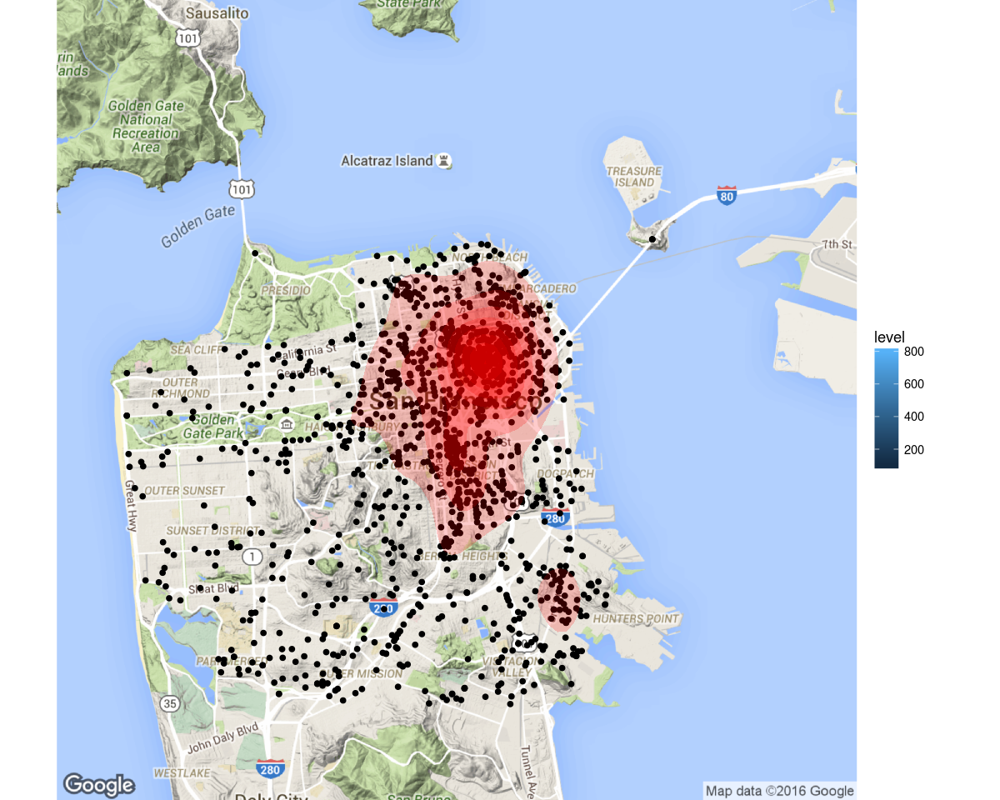

In [97]:
sampled_data = data %>% sample_n(1500)
# plot_data = sampled_data %>%
#     filter(Category=="SEX OFFENSES FORCIBLE")

plot_data = sampled_data


qmap('san fracisco', zoom = 12, legend = 'right') +
    geom_point(data=plot_data, aes(x=X, y=Y)) +
    stat_density_2d(data=plot_data, aes(x=X, y=Y, fill= ..level..), geom = "polygon", alpha=0.2, fill='red')



### Vandalism

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=san+fracisco&zoom=12&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=san%20fracisco&sensor=false


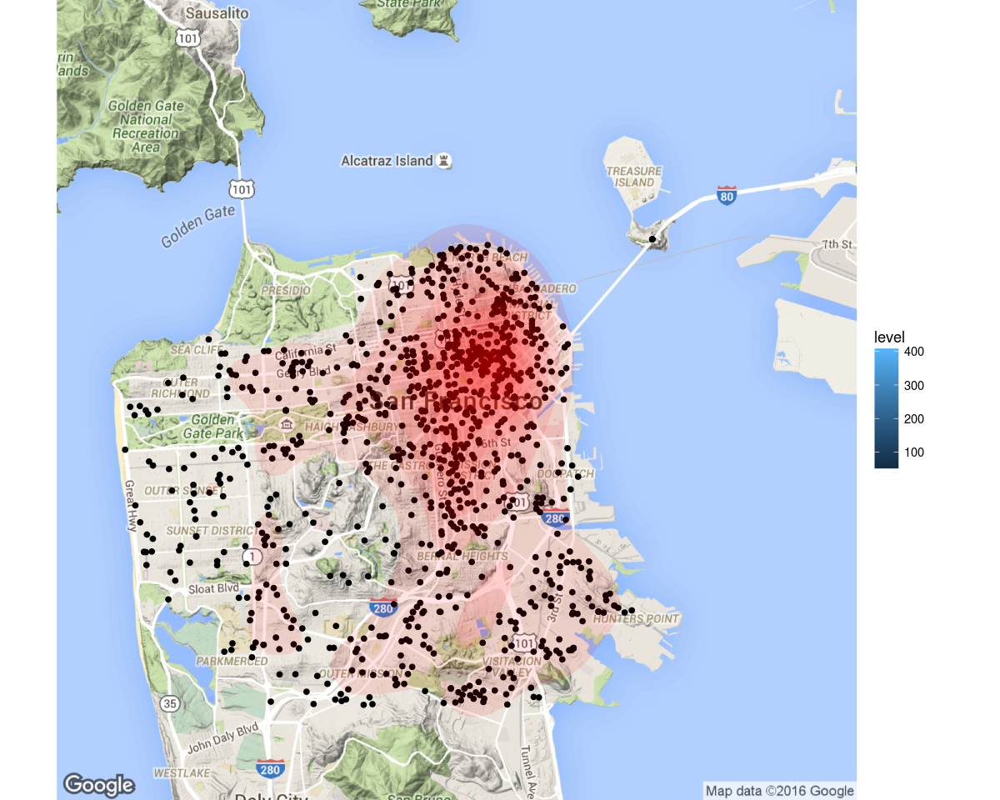

In [104]:
plot_data = data %>%
    filter(Category=="VANDALISM") %>%
    sample_n(1000)

qmap('san fracisco', zoom = 12, legend = 'right') +
    geom_point(data=plot_data, aes(x=X, y=Y)) +
    stat_density_2d(data=plot_data, aes(x=X, y=Y, fill= ..level..), geom = "polygon", alpha=0.1, fill='red')

### Family Offense

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=san+fracisco&zoom=12&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=san%20fracisco&sensor=false


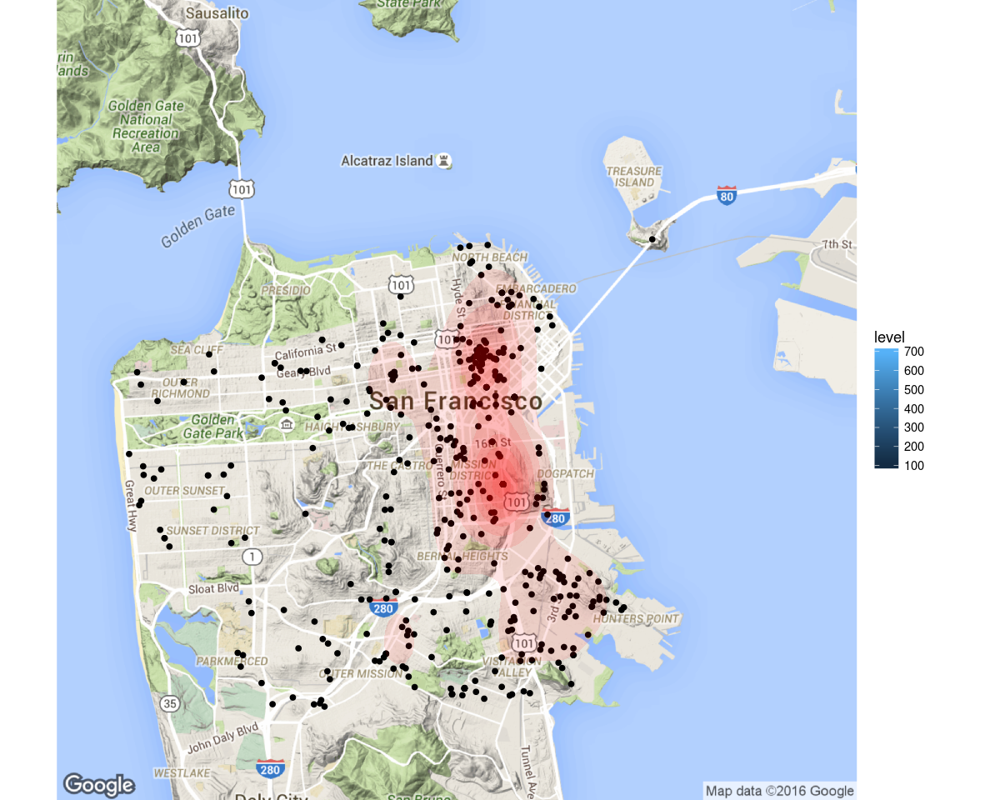

In [103]:
plot_data = data %>%
    filter(Category=="FAMILY OFFENSES")

qmap('san fracisco', zoom = 12, legend = 'right') +
    geom_point(data=plot_data, aes(x=X, y=Y)) +
    stat_density_2d(data=plot_data, aes(x=X, y=Y, fill= ..level..), geom = "polygon", alpha=0.1, fill='red')

### Vehicle Theft

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=san+fracisco&zoom=12&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=san%20fracisco&sensor=false


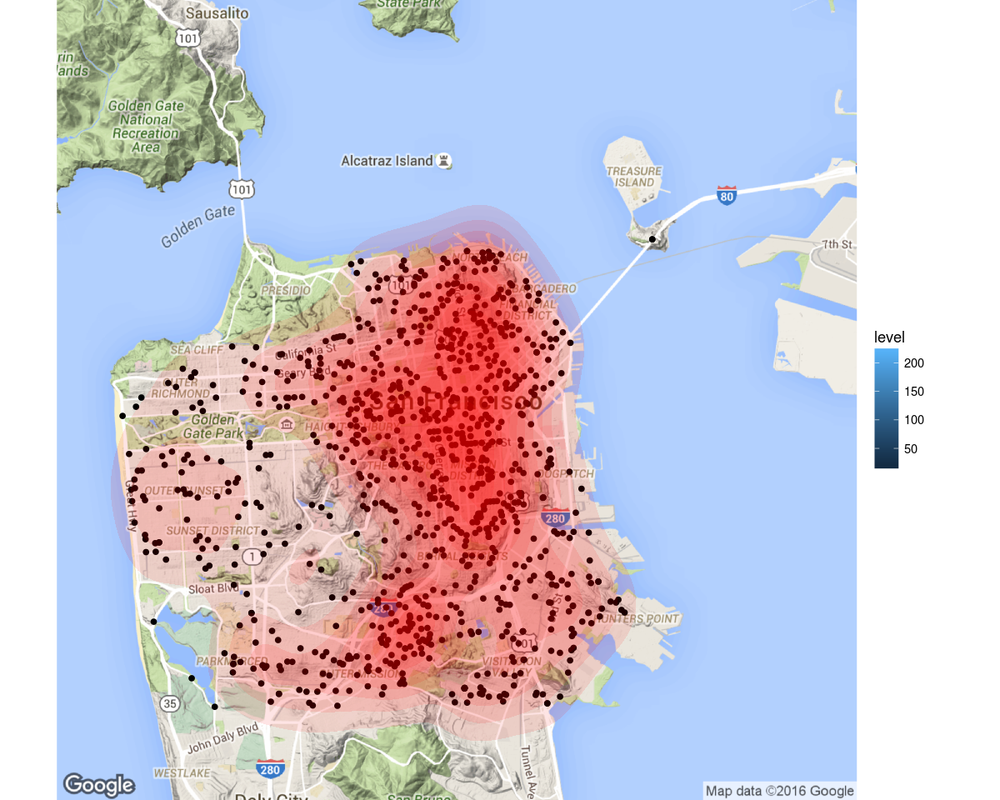

In [102]:
plot_data = data %>%
    filter(Category=="VEHICLE THEFT") %>%
    sample_n(1000)

qmap('san fracisco', zoom = 12, legend = 'right') +
    geom_point(data=plot_data, aes(x=X, y=Y)) +
    stat_density_2d(data=plot_data, aes(x=X, y=Y, fill= ..level..), geom = "polygon", alpha=0.1, fill='red')

### Assult

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=san+fracisco&zoom=12&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=san%20fracisco&sensor=false


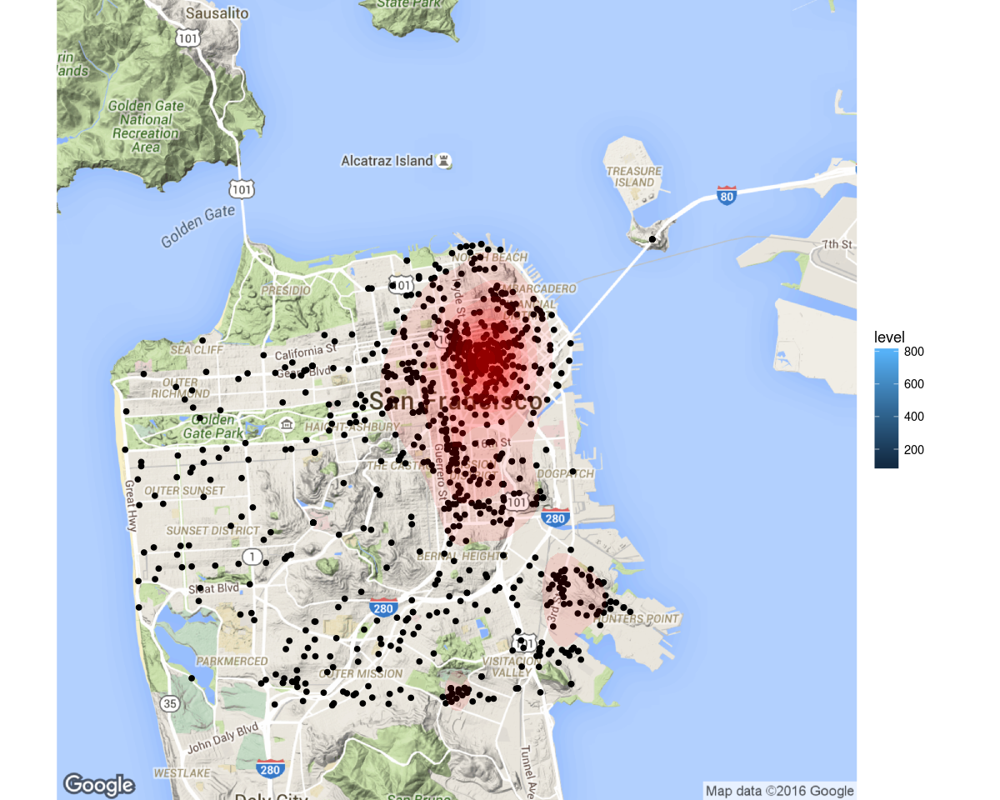

In [110]:
plot_data = data %>%
    filter(Category=="ASSAULT") %>%
    sample_n(1000)

qmap('san fracisco', zoom = 12, legend = 'right') +
    geom_point(data=plot_data, aes(x=X, y=Y)) +
    stat_density_2d(data=plot_data, aes(x=X, y=Y, fill= ..level..), geom = "polygon", alpha=0.1, fill='red')